# Regression

For this lab, let's use county-level 2020 presidential election results. 

In [1]:
quietly cd c:\Users\bowen\OneDrive\Courses\Political_Analysis\Labs\F2020\

In [2]:
use pres_county2020.dta, clear

### Simple and Multiple Regression



      Source |       SS           df       MS      Number of obs   =     3,112
-------------+----------------------------------   F(1, 3110)      =  73277.15
       Model |   775987.71         1   775987.71   Prob > F        =    0.0000
    Residual |  32934.1652     3,110  10.5897637   R-squared       =    0.9593
-------------+----------------------------------   Adj R-squared   =    0.9593
       Total |  808921.875     3,111  260.019889   Root MSE        =    3.2542

------------------------------------------------------------------------------
  trump20pct |      Coef.   Std. Err.      t    P>|t|     [95% Conf. Interval]
-------------+----------------------------------------------------------------
    trumppct |   .9776738   .0036117   270.70   0.000     .9705923    .9847554
       _cons |  -.0372979   .2477361    -0.15   0.880    -.5230407    .4484449
------------------------------------------------------------------------------


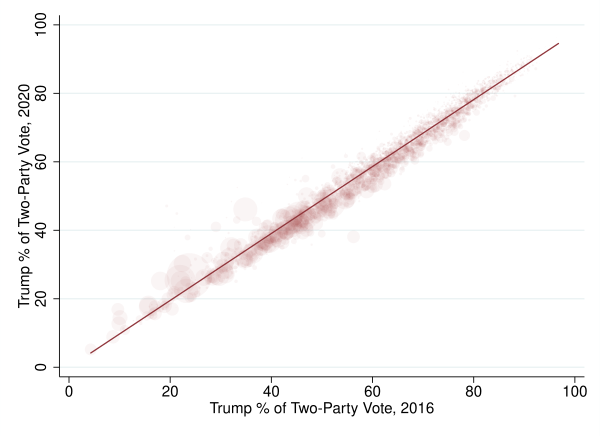

In [3]:
* SYNTAX: reg y x
reg trump20pct trumppct

* let's visualize:
scatter trump20pct trumppct [pw=total20votes], ///
    msize(small) mcolor(maroon%5) mlwidth(none) ///
    graphregion(color(white)) ///
    || lfit trump20pct trumppct, lcolor(maroon) ///
     legend(off) xtitle("Trump % of Two-Party Vote, 2016") ///
    ytitle("Trump % of Two-Party Vote, 2020")

Now let's conduct a multiple regression, adding county race and education variables:

In [4]:
* SYNTAX: reg y x1 x2...

reg trump20pct trumppct whitenoncollege whitecollege black latinx


      Source |       SS           df       MS      Number of obs   =     3,111
-------------+----------------------------------   F(5, 3105)      =  20398.24
       Model |  781995.993         5  156399.199   Prob > F        =    0.0000
    Residual |  23806.9313     3,105  7.66728866   R-squared       =    0.9705
-------------+----------------------------------   Adj R-squared   =    0.9704
       Total |  805802.924     3,110  259.100619   Root MSE        =     2.769

-------------------------------------------------------------------------------
   trump20pct |      Coef.   Std. Err.      t    P>|t|     [95% Conf. Interval]
--------------+----------------------------------------------------------------
     trumppct |   .9396296    .004703   199.79   0.000     .9304082     .948851
whitenoncol~e |   7.180532   .8133951     8.83   0.000     5.585685    8.775379
 whitecollege |  -13.35032   .9881584   -13.51   0.000    -15.28783   -11.41281
        black |   4.517834   .8052197     5.

### Predictions and Residuals

Stata has built-in postestimation commands which help you extract additional information from your model results. ***predict*** is a very useful postestimation command, available for a wide range of model types, including OLS. We can use ***predict*** to calculated $\hat{y}$ as well as residuals ($y_i - \hat{y}$). ***predict*** will call up your most recent model results to use for analysis, or you could store your regression results and then call up whichever model results you want.

In [5]:
quietly reg trump20pct trumppct
* save regression results and name them "m1"
estimates store m1

quietly reg  trump20pct trumppct whitenoncollege whitecollege black latinx
* save regression results and name them "m2"
estimates store m2

* now restore m1 results
estimates restore m1

*predict y_hat:
* SYNTAX: predict newvar, options
predict y_hat_m1

*we could calculate residuals directly as well:
predict residual_m1, residuals

estimates restore m2
predict y_hat_m2
predict residual_m2, residuals







(results m1 are active now)

(option xb assumed; fitted values)
(107 missing values generated)

(149 missing values generated)

(results m2 are active now)

(option xb assumed; fitted values)
(147 missing values generated)

(150 missing values generated)


How well do our models match the actual Trump % in 2020? Pretty well! We could plot the predict values against our original DV:

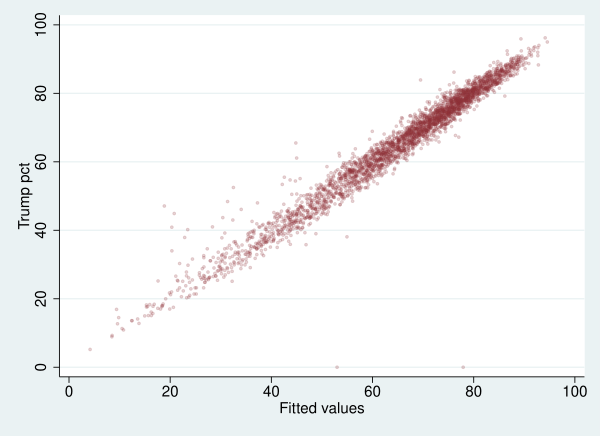

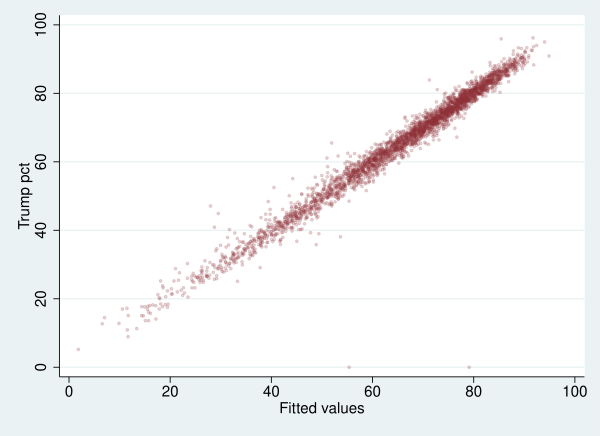

In [6]:
scatter trump20pct y_hat_m1, msize(vsmall) mcolor(maroon%15)
scatter trump20pct y_hat_m2, msize(vsmall) mcolor(maroon%15)

Even better, we can plot the residuals directly: 

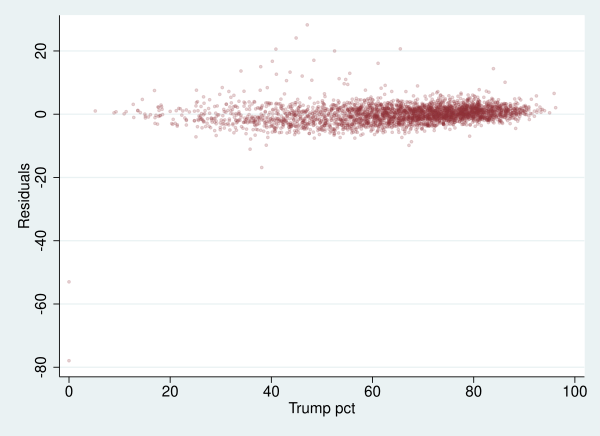

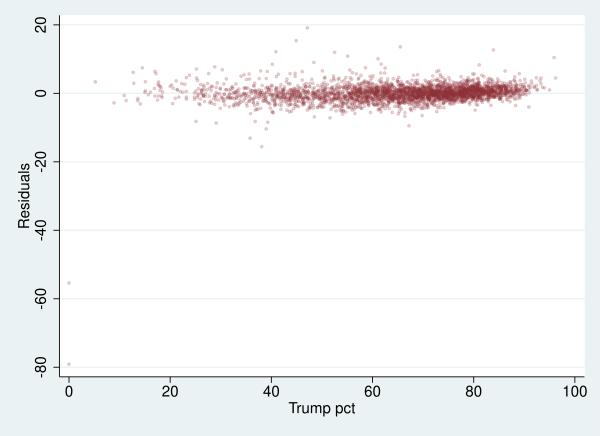

In [7]:
scatter residual_m1 trump20pct , msize(vsmall) mcolor(maroon%15)
scatter residual_m2 trump20pct, msize(vsmall) mcolor(maroon%15)

### Regression with nominal data

To incorporate independent variables measured at the categorical/nominal level, you need to create a series of dummy (dichotomous) variables. You could do so by hand using the ***recode*** command, or you could use Stata's factor variable notation: add an ***i.*** in front of the variable name. An additional strategy is to use ***tab*** with the ***gen()*** option. I use strategies two and three in the example below.

In [8]:
* add region dummies to the regression model 

*first create the dummies:
tab region, gen(regdum)
describe regdum*

*now run the regression, being sure to leave out one dummy (in this case, the South)
reg trump20pct trumppct whitenoncollege whitecollege black latinx regdum1 regdum2 regdum4
estimates store m3

*we could do a similar regression with i.region, but we won't be able to define
* the reference category.
reg trump20pct trumppct whitenoncollege whitecollege black latinx i.region



     region |      Freq.     Percent        Cum.
------------+-----------------------------------
          1 |        217        7.01        7.01
          2 |      1,056       34.10       41.10
          3 |      1,366       44.11       85.21
          4 |        458       14.79      100.00
------------+-----------------------------------
      Total |      3,097      100.00


              storage   display    value
variable name   type    format     label      variable label
--------------------------------------------------------------------------------
regdum1         byte    %8.0g                 region== 1.0000
regdum2         byte    %8.0g                 region== 2.0000
regdum3         byte    %8.0g                 region== 3.0000
regdum4         byte    %8.0g                 region== 4.0000


      Source |       SS           df       MS      Number of obs   =     3,055
-------------+----------------------------------   F(8, 3046)      =  13200.57
       Model |  772218.98

### Interaction terms and marginal effects

The easiest way to incorporate interaction terms into your regression analysis is by using Stata's built-in interaction notation. ## signifies an interaction between two independent variables and will inporate the interaction term into the model. For example: _reg y c.x##c.z_, assuming you want to treat _x_ and _z_ as ordinal or interval data. If _x_ is nominal, you'd use: _i.x_ instead of _i.z_. 

The ***margins*** command lets you calculate the predicted effect of your constituent variables AND the interaction on the dependent variable. We call these _conditional marginal effects_ the effect of one variable, conditional on the other (because of the interaction term, the predicted effect of _x_ varies by _z_).



      Source |       SS           df       MS      Number of obs   =     3,055
-------------+----------------------------------   F(9, 3045)      =  11772.68
       Model |  772297.501         9  85810.8334   Prob > F        =    0.0000
    Residual |  22194.9365     3,045   7.2889775   R-squared       =    0.9721
-------------+----------------------------------   Adj R-squared   =    0.9720
       Total |  794492.437     3,054  260.148146   Root MSE        =    2.6998

-------------------------------------------------------------------------------
   trump20pct |      Coef.   Std. Err.      t    P>|t|     [95% Conf. Interval]
--------------+----------------------------------------------------------------
     trumppct |   .9291103   .0051341   180.97   0.000     .9190436     .939177
whitenoncol~e |   6.034341   .8191837     7.37   0.000     4.428132     7.64055
        black |   .5535949   .8487943     0.65   0.514    -1.110673    2.217863
       latinx |   9.384419   .8487705    11

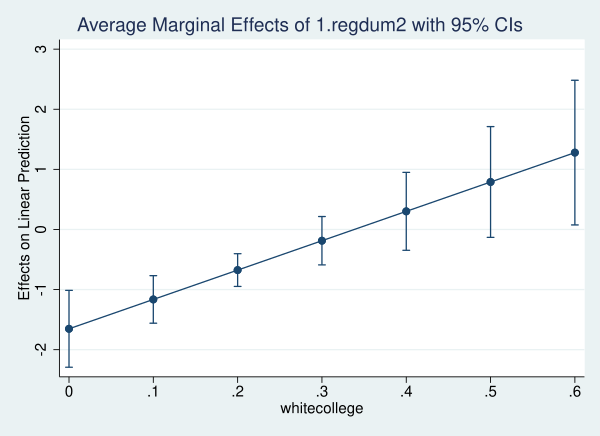

In [9]:
reg trump20pct trumppct whitenoncollege black latinx regdum1 i.regdum2##c.whitecollege regdum4
estimates store m4
* the dydx(regdum2) option requests Stata calculate the marginal effect of being in the Midwest
* over the values specified in the at() command, in this case, when whitecollege moves from 0 
* to .6 in units of .1.
margins, dydx(regdum2) at(whitecollege=(0(.1).6))

* marginsplot will graph the results from the margins command. Check out help marginsplot to 
*  see some of the options you can use to change the look of the graph.
marginsplot

### Presentation of Results

My favorite ways of presenting regression results require adding user-generated Stata commands. You can add such commands from Boston College's Statistical Software Components (SSC) archive through ***ssc install***. We'll use two packages: ***estout*** and ***coefplot***. 

#### esttab
The ***esttab*** command, from the ***estout*** package, is, in my opinion, the best way to generate regression tables in Stata. The command lets you make tables of multiple regression models, gives you flexibility over which parameter estimates to include, and formatting control over the look of the table. 

In [10]:
* install the estout package from the SSC
ssc install estout

* SYNTAX: esttab model_names, options
*   the m1 through m4 item below are our stored model names from previous regressions
*   b se options tell Stata to include the coefficients (b) and standard errors (se)
*   star() option lists a symbol and then the significance level 
*   the wide option places standard errors to the right of coefficients instead of 
*      underneath the coefficients - good if you have multiple models to include
*      in the table.
*   the ar2 option adds the Adj. R^2 score at the bottom of the table. 

esttab m1 m2 m3 m4, b se star(+ .1 * .05 ** .01) wide ar2 

* You can save the table directly to your computer!
quietly esttab m1 m2 m3 m4 using regmodels.csv, b se star(+ .1 * .05 ** .01) wide ar2 csv replace 


checking estout consistency and verifying not already installed...
all files already exist and are up to date.


--------------------------------------------------------------------------------
> --------------------------------------------
                      (1)                         (2)                         (3
> )                         (4)               
               trump20pct                  trump20pct                  trump20pc
> t                  trump20pct               
--------------------------------------------------------------------------------
> --------------------------------------------
trumppct            0.978**    (0.00361)        0.940**    (0.00470)        0.93
> 0**    (0.00513)        0.929**    (0.00513)
whitenonco~e                                    7.181**      (0.813)        6.08
> 0**      (0.820)        6.034**      (0.819)
whitecollege                                   -13.35**      (0.988)       -14.2
> 9**      (0.976)       -15.78**    

#### coefplot

The ***coefplot*** command offers an easy way to graph coefficient estimates and confidence intervals around those estimates. ***coefplot*** works best when your variables are the same. 


checking coefplot consistency and verifying not already installed...
all files already exist and are up to date.

(results m3 are active now)


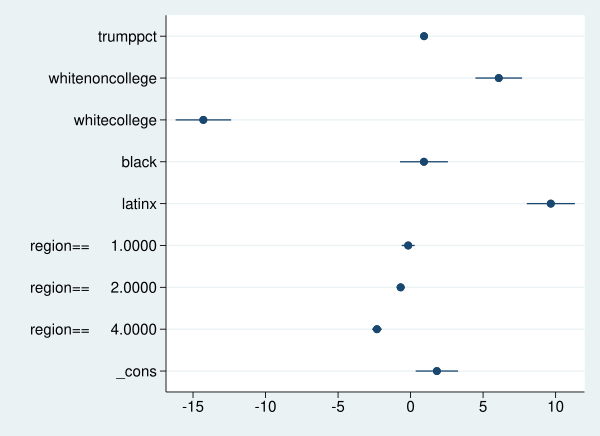

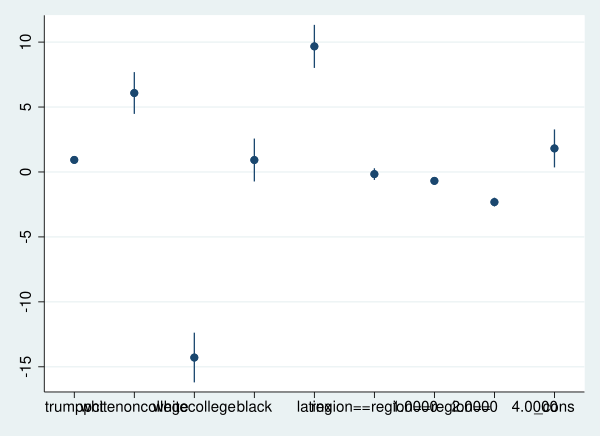

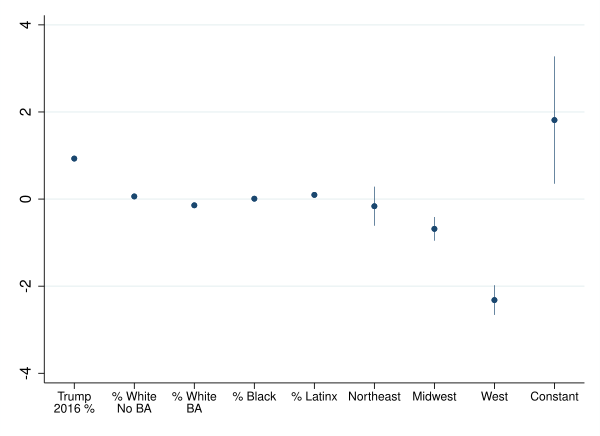

In [11]:
* install the coefplot package

ssc install coefplot

* load the m3 model results
estimates restore m3 

coefplot

* now let's make the dots vertical:
coefplot, vertical

* let's rescale our proportion variables and change the labels:
coefplot, vertical msize(small) ciopts(lwidth(vthin)) rescale(whitenoncollege = .01 whitecollege = .01 black = .01 latinx = .01) ///
    coeflabels(trumppct = `""Trump""2016 %""' whitenoncollege = `""% White""No BA""' whitecollege = `""% White""BA""' ///
    black = "% Black" latinx = "% Latinx" regdum1 = "Northeast" regdum2 = "Midwest" regdum4 = "West" ///
    _cons = "Constant" , labsize(small)) graphregion(color(white))
